In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
from spider import SPIDER
op = SPIDER()
import anndata
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import umap

2023-06-23 14:22:03.652827: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-06-23 14:22:03.654710: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-23 14:22:03.692339: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-23 14:22:03.693728: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-23 14:22:04.355864: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [2]:
ds = 'DFPLC'
data_sets = ["151507", "151508", "151509", "151510", "151669", "151670", "151671", "151672","151673", "151675", "151676"]


main

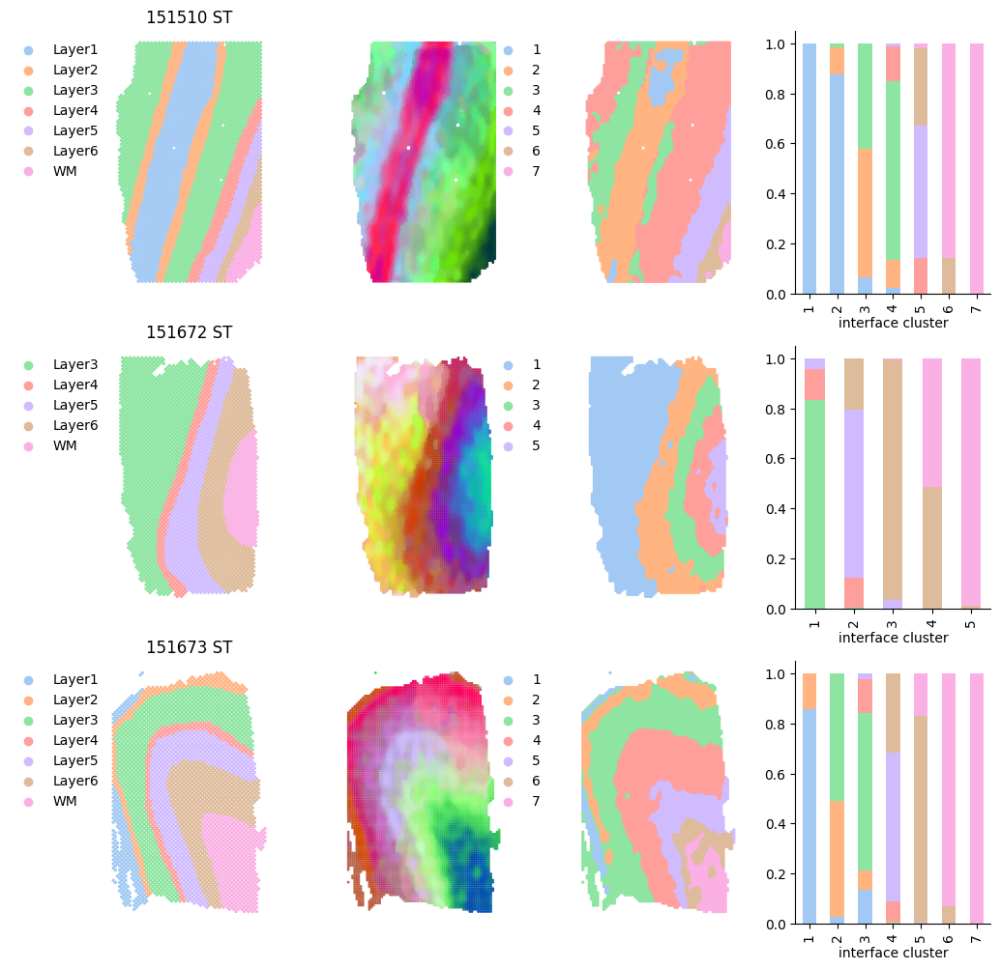

In [4]:
color_list = sns.color_palette("pastel")

pal = {}
count = 0
for i in ['Layer1', 'Layer2', 'Layer3', 'Layer4', 'Layer5', 'Layer6', 'WM']:
    pal[i] = color_list[count]
    count+=1

data_sets = ['151510', '151672', '151673']
# data_sets = ['151510']
plt.figure(figsize=(4*3, 3*4))
base = 1
spot_size=6
for input1 in range(len(data_sets)):
    data_name = data_sets[input1]
    out_f = f'../datasets/DFPLC/{data_name}/'
    idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')
    
    plt.subplot(3,4, base)
    g=sns.scatterplot(data=idata.uns['cell_meta'], x='row', y='col', hue ='layer_guess', s=spot_size, palette=pal, linewidth=0)
    g.legend(loc='upper right', bbox_to_anchor=(0.1, 1), ncol=1,frameon =False)
    plt.axis('equal')
    plt.axis('off')
    plt.title(f'{data_name} ST', y=1)
    base += 1
    
    
    features = pd.read_csv(f'{out_f}/interface_SpatialPCs.csv', index_col=0).T
    idata.obsm['spatialPC'] = features.loc[idata.obs_names].to_numpy()
    umap_3 = umap.UMAP(random_state=52, n_components=3).fit_transform(idata.obsm['spatialPC'])
    normalized_df=pd.DataFrame(umap_3)
    normalized_df = (normalized_df-normalized_df.min())/(normalized_df.max()-normalized_df.min())
    normalized_df.columns=['r', 'g', 'b']
    normalized_df[['x', 'y']] = idata.obsm['spatial']
    plt.subplot(3,4, base)
    plt.scatter(normalized_df.x, normalized_df.y, c = normalized_df[['r', 'g', 'b']].to_numpy(), s=1)
    plt.axis('equal')
    plt.axis('off')
    # plt.title(f'{data_name}')
    base += 1
    
    label_df = pd.read_csv(f'{out_f}/refined_interface_label.csv', index_col=0)
    idata.obs['label_spatialPCA'] = label_df.loc[idata.obs_names]['clusterlabel_refine'].to_numpy()
    
    dfs = []
    for i in idata.obs['label_spatialPCA'].unique():
        dfs.append(idata.uns['cell_meta'].loc[np.unique(idata.obs[idata.obs['label_spatialPCA']==i][['A', 'B']].to_numpy().flatten()), 'layer_guess'].value_counts())
    dfs_merged = pd.concat(dfs, axis=1)
    dfs_merged.columns=idata.obs['label_spatialPCA'].unique()
    dfs_merged = (dfs_merged / dfs_merged.sum()).T
    order = np.dot(dfs_merged, (range(1, len(dfs_merged.columns)+1))).argsort()
    rename_dict = {}
    for i in range(len(dfs_merged.index)):
        rename_dict[dfs_merged.index[order[i]]] = i+1
    dfs_merged = dfs_merged.reset_index().rename(columns={'index':'interface cluster'})
    dfs_merged['interface cluster'] = dfs_merged['interface cluster'].astype('category').cat.rename_categories(rename_dict).cat.reorder_categories(range(1, len(dfs_merged)+1))
    label_df['clusterlabel_refine'] = label_df['clusterlabel_refine'].astype('category').cat.rename_categories(rename_dict).cat.reorder_categories(range(1, len(dfs_merged)+1))
    
    plt.subplot(3, 4, base)
    g=sns.scatterplot(data=label_df, x='row', y='col', hue = 'clusterlabel_refine', s=spot_size, palette='pastel', linewidth=0)
    # g=sns.scatterplot(data=label_df, x='row', y='col', hue = 'clusterlabel_refine', s=spot_size, palette=interface_pal, linewidth=0)
    g.legend(loc='upper left', bbox_to_anchor=(-0.4, 1), ncol=1,frameon =False)
    plt.axis('equal')
    plt.axis('off')
    # plt.title(f'{data_name}-{prefix}:\n{round(adjusted_rand_score(true_label, idata.obs["label_spatialPCA"]), 3)}')
    base += 1
    
    ax = plt.subplot(3, 4, base)
    dfs_merged.sort_values('interface cluster').plot.bar(x='interface cluster', stacked=True, color=pal, legend=False, ax=ax)
    ax.spines[['right', 'top']].set_visible(False)
    base += 1
plt.savefig(f'../figures/DLPFC_main.png', bbox_inches="tight",dpi=600)

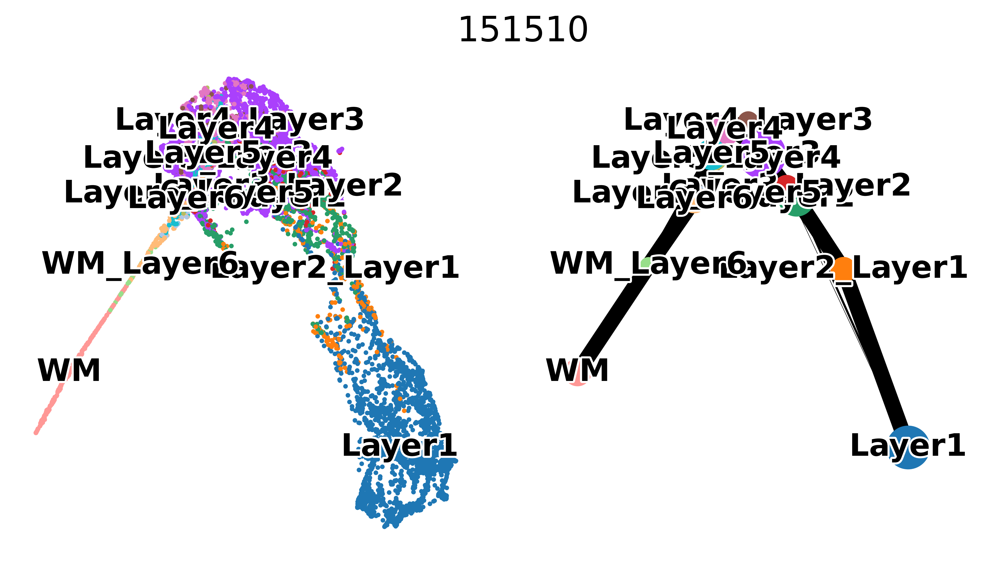

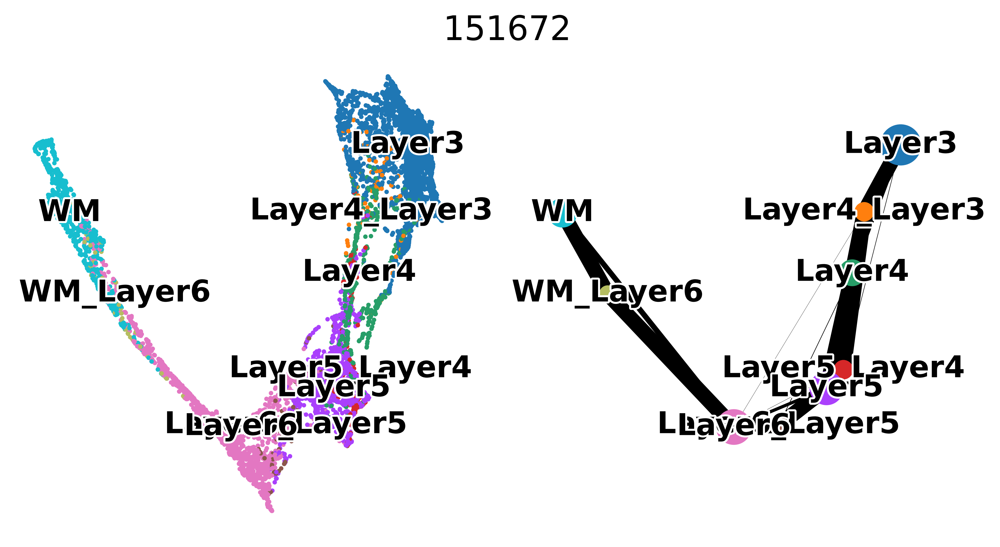

In [8]:
As = []
data_sets = ['151510', '151672']
for input1 in range(len(data_sets)):
    data_name = data_sets[input1]
    out_f = f'../datasets/{ds}/{data_name}/'
    idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')
    features = pd.read_csv(f'{out_f}/interface_SpatialPCs.csv', index_col=0).T
    idata.obsm['smooth_pattern_score'] = features.loc[idata.obs_names].to_numpy()
    op.traj.paga_default(idata, label='label')
    As.append(idata.uns['paga']['connectivities'].A)
    plt.rcParams["figure.figsize"] = (4,3)
    sc.set_figure_params(dpi=300)
    idata.obs['label'] = idata.obs['label'].astype('category').cat.rename_categories({
        'WM_WM': 'WM',    
        'Layer4_Layer4': 'Layer4',    
        'Layer1_Layer1': 'Layer1',    
        'Layer5_Layer5': 'Layer5',    
        'Layer6_Layer6': 'Layer6',    
        'Layer2_Layer2': 'Layer2',    
        'Layer3_Layer3': 'Layer3',    
    })
    with plt.rc_context():
        sc.pl.paga_compare(idata, legend_fontsize=15, frameon=False, size=20, fontweight='normal', legend_loc='on data',
                        title=data_name, legend_fontoutline=2, show=False)
        plt.savefig(f'../figures/{ds}_{data_name}_paga_comp_umap3.png')

supp

In [ ]:
data_sets = ["151507", "151508", "151509", "151510", "151669", "151670", "151671", "151672","151673", "151675", "151676"]

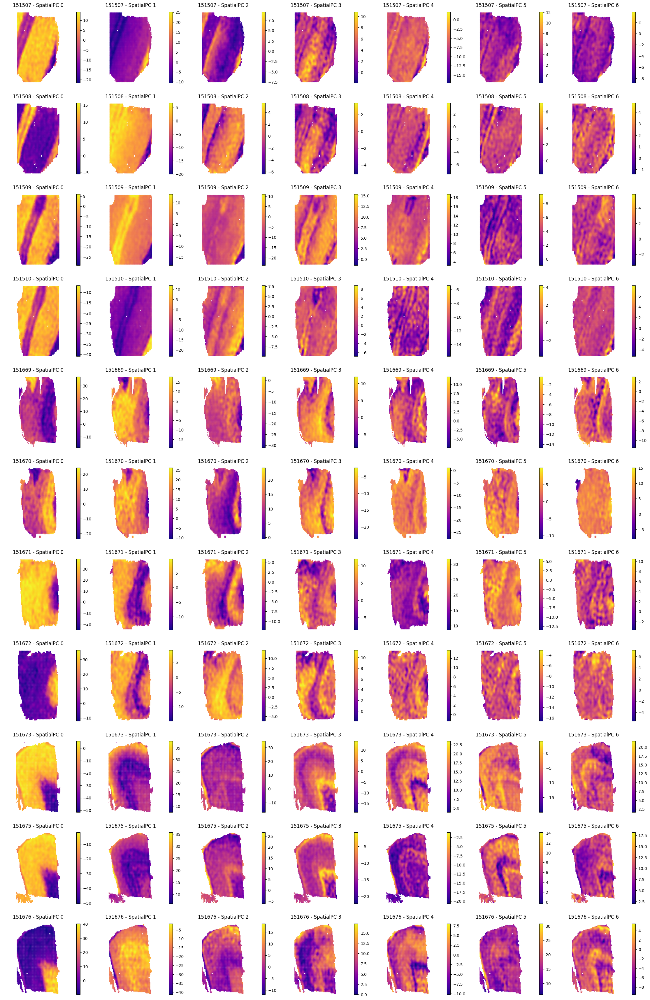

In [16]:
plt.figure(figsize=(28, 44))
base = 1
for input1 in range(len(data_sets)):
    data_name = data_sets[input1]
    out_f = f'../datasets/{ds}/{data_name}/'
    idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')

    features = pd.read_csv(f'{out_f}interface_SpatialPCs.csv', index_col=0).T
    idata.obsm['spatialPC'] = features.loc[idata.obs_names].to_numpy()
    obsm_key = 'spatialPC'
    for i in range(idata.obsm[obsm_key].shape[1]):
        plt.subplot(11, 7, base)
        im=plt.scatter(idata.obs['row'], idata.obs['col'], c=idata.obsm[obsm_key][:,i], s=1, cmap='plasma')
        plt.axis('equal')
        plt.axis('off')
        plt.title(f'{data_name} - SpatialPC {i}')
        plt.colorbar(im,fraction=0.046, pad=0.04)
        base += 1
        
plt.savefig(f'../figures/{ds}_interface_features.pdf', bbox_inches="tight",dpi=300)


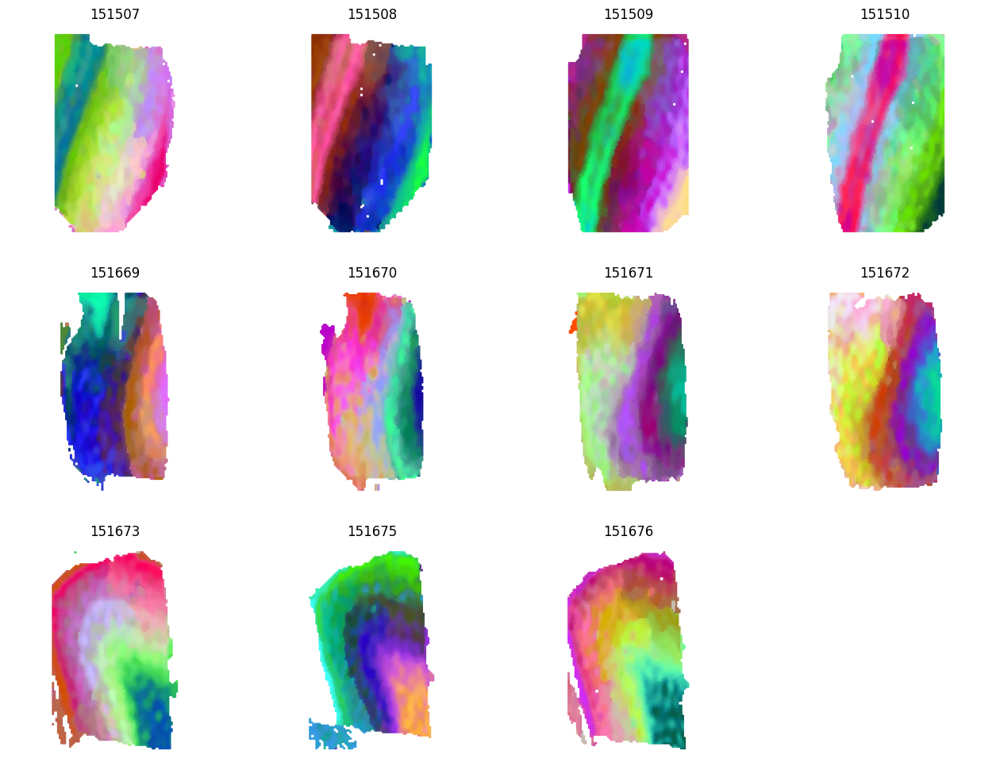

In [17]:
data_sets = ["151507", "151508", "151509", "151510", "151669", "151670", "151671", "151672","151673", "151675", "151676"]
plt.figure(figsize=(16, 12))
base = 1
for input1 in range(len(data_sets)):
    data_name = data_sets[input1]
    out_f = f'../datasets/{ds}/{data_name}/'
    idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')
    # idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')

    features = pd.read_csv(f'{out_f}interface_SpatialPCs.csv', index_col=0).T
    idata.obsm['spatialPC'] = features.loc[idata.obs_names].to_numpy()

    umap_3 = umap.UMAP(random_state=52, n_components=3).fit_transform(idata.obsm['spatialPC'])
    normalized_df=pd.DataFrame(umap_3)
    normalized_df = (normalized_df-normalized_df.min())/(normalized_df.max()-normalized_df.min())
    normalized_df.columns=['r', 'g', 'b']
    normalized_df[['x', 'y']] = idata.obsm['spatial']
    plt.subplot(3, 4, base)
    plt.scatter(normalized_df.x, normalized_df.y, c = normalized_df[['r', 'g', 'b']].to_numpy(), s=1.5)
    plt.axis('equal')
    plt.axis('off')
    plt.title(f'{data_name}')
    base += 1
plt.savefig(f'../figures/{ds}_interface_rgb_features.pdf', bbox_inches="tight",dpi=300)

In [18]:
# data_sets = ["151507", "151508", "151509", "151510", "151669", "151670", "151671", "151672","151673", "151675", "151676"]
plt.figure(figsize=(16, 12))
base = 1
for input1 in range(len(data_sets)):
    data_name = data_sets[input1]
    out_f = f'../datasets/{ds}/{data_name}/'
    idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')
    # idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')

    label_df = pd.read_csv(f'{out_f}/refined_interface_label.csv', index_col=0)
    
    idata.obs['label_spatialPCA'] = label_df.loc[idata.obs_names]['clusterlabel_refine'].to_numpy()
    true_label = idata.obs['label'].to_numpy()
    plt.subplot(3, 4, base)
    g=sns.scatterplot(data=label_df, x='row', y='col', hue = 'clusterlabel_refine', s=5, palette='pastel', linewidth=0)
    g.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
    plt.axis('equal')
    plt.axis('off')
    # plt.title(f'{data_name}:\n{round(adjusted_rand_score(true_label, idata.obs["label_spatialPCA"]), 3)}')
    plt.title(f'{data_name}')
    base += 1
    
plt.savefig(f'../figures/{ds}_refined_interface_clustering.pdf', bbox_inches="tight",dpi=300)
plt.close()

<Figure size 1600x1200 with 0 Axes>

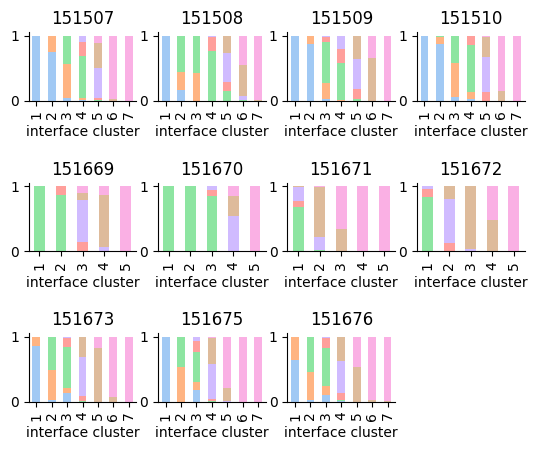

In [19]:
# data_sets = ["151507", "151508", "151509", "151510", "151669", "151670", "151671", "151672","151673", "151675", "151676"]
color_list = sns.color_palette("pastel")
pal = {}
count = 0
for i in ['Layer1', 'Layer2', 'Layer3', 'Layer4', 'Layer5', 'Layer6', 'WM']:
    pal[i] = color_list[count]
    count+=1
plt.figure(figsize=(16, 12))
fig, axes = plt.subplots(3, 4)
base = 0
for input1 in range(len(data_sets)):
    data_name = data_sets[input1]
    out_f = f'../datasets/{ds}/{data_name}/'
    idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')
    # idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')

    label_df = pd.read_csv(f'{out_f}/refined_interface_label.csv', index_col=0)
    idata.obs['label_spatialPCA'] = label_df.loc[idata.obs_names]['clusterlabel_refine'].to_numpy()
    
    dfs = []
    for i in idata.obs['label_spatialPCA'].unique():
        dfs.append(idata.uns['cell_meta'].loc[np.unique(idata.obs[idata.obs['label_spatialPCA']==i][['A', 'B']].to_numpy().flatten()), 'layer_guess'].value_counts())
    dfs_merged = pd.concat(dfs, axis=1)
    dfs_merged.columns=idata.obs['label_spatialPCA'].unique()
    dfs_merged = (dfs_merged / dfs_merged.sum()).T
    order = np.dot(dfs_merged, (range(1, len(dfs_merged.columns)+1))).argsort()
    rename_dict = {}
    for i in range(len(dfs_merged.index)):
        rename_dict[dfs_merged.index[order[i]]] = i+1
    dfs_merged = dfs_merged.reset_index().rename(columns={'index':'interface cluster'})
    dfs_merged['interface cluster'] = dfs_merged['interface cluster'].astype('category').cat.rename_categories(rename_dict).cat.reorder_categories(range(1, len(dfs_merged)+1))
    label_df['clusterlabel_refine'] = label_df['clusterlabel_refine'].astype('category').cat.rename_categories(rename_dict).cat.reorder_categories(range(1, len(dfs_merged)+1))
    # g = dfs_merged.sort_values('interface cluster').plot.bar(x='interface cluster', stacked=True, legend=False)
    # g.spines[['right', 'top']].set_visible(False)
    
    dfs_merged.sort_values('interface cluster').plot.bar(x='interface cluster', stacked=True, color=pal, legend=False, ax=axes[int(base/4)][int(base%4)], title=data_name)
    axes[int(base/4)][int(base%4)].spines[['right', 'top']].set_visible(False)
    # plt.title(f'{data_name}:\n{round(adjusted_rand_score(true_label, idata.obs["label_spatialPCA"]), 3)}')
    # plt.title(f'{data_name}')
    base += 1
fig.delaxes(axes[int(base/4)][int(base%4)])
plt.subplots_adjust(hspace=1.2) 
plt.savefig(f'../figures/{ds}_refined_interface_clustering_barplot.pdf', bbox_inches="tight",dpi=300)

In [20]:
marker_dfs = []
enr_dfs = []
for input1 in range(len(data_sets)):
    data_name = data_sets[input1]
    out_f = f'../datasets/{ds}/{data_name}/'
    idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')
    
    label_df = pd.read_csv(f'{out_f}/refined_interface_label.csv', index_col=0)
    idata.obs['label_spatialPCA'] = label_df.loc[idata.obs_names]['clusterlabel_refine'].astype(str).astype('category')
    dfs = []
    for i in idata.obs['label_spatialPCA'].unique():
        dfs.append(idata.uns['cell_meta'].loc[np.unique(idata.obs[idata.obs['label_spatialPCA']==i][['A', 'B']].to_numpy().flatten()), 'layer_guess'].value_counts())
    dfs_merged = pd.concat(dfs, axis=1)
    dfs_merged.columns=idata.obs['label_spatialPCA'].unique()
    dfs_merged = (dfs_merged / dfs_merged.sum()).T
    order = np.dot(dfs_merged, (range(1, len(dfs_merged.columns)+1))).argsort()
    rename_dict = {}
    for i in range(len(dfs_merged.index)):
        rename_dict[dfs_merged.index[order[i]]] = i+1
    dfs_merged = dfs_merged.reset_index().rename(columns={'index':'interface cluster'})
    dfs_merged['interface cluster'] = dfs_merged['interface cluster'].astype('category').cat.rename_categories(rename_dict).cat.reorder_categories(range(1, len(dfs_merged)+1))
    label_df['clusterlabel_refine'] = label_df['clusterlabel_refine'].astype('category').cat.rename_categories(rename_dict).cat.reorder_categories(range(1, len(dfs_merged)+1))
    idata.obs['label_spatialPCA'] = label_df.loc[idata.obs_names]['clusterlabel_refine'].astype(str).astype('category')
    sc.tl.rank_genes_groups(idata, groupby='label_spatialPCA', method='wilcoxon')
    marker_df = op.util.get_marker_df(idata, logfoldchanges_threhold=5)
    marker_df['sample'] = data_name
    marker_dfs.append(marker_df.copy())
    # sc.pl.rank_genes_groups_dotplot(idata, n_genes=5,values_to_plot='logfoldchanges', min_logfoldchange=5, vmax=np.abs(marker_df['logfoldchanges'].max()), vmin=-np.abs(marker_df['logfoldchanges'].max()), cmap='bwr', save=f'{data_name}_marker_dot.pdf')
    # sc.pl.spatial(idata, color=list(idata.uns['rank_genes_groups']['names'][:1].flatten()[0]), spot_size=0.8, save=f'{data_name}_marker_exp.pdf')
    custom, background = op.er.pathway_prep(idata)
    marker_df['g'] = marker_df['names']
    marker_df['membership'] = 1
    # marker_df.to_csv(f'./tables/{data_name}_marker.csv')
    merged_df_edge, arr = op.er.enrichment(custom, background, marker_df.set_index('names'), groupby='cluster')
    merged_df_edge = merged_df_edge[merged_df_edge["Adjusted P-value"]<=0.05]
    merged_df_edge['sample'] = data_name
    enr_dfs.append(merged_df_edge)
    # .to_csv(f'./tables/{data_name}_marker_edge_enrichment.csv')
    # merged_df_edge.to_csv(f'./tables/{data_name}_marker_edge_enrichment_full.csv')
    # merged_df, arr = op.er.enrichment_interacrtion_gene_df(marker_df.set_index('names'), groupby='cluster')
    # merged_df[merged_df["Adjusted P-value"]<=0.05].to_csv(f'./tables/{data_name}_marker_node_enrichment.csv')
    # merged_df[merged_df["Adjusted P-value"]<=0.05].to_csv(f'./tables/{data_name}_marker_node_enrichment.csv')
pd.concat(marker_dfs).to_csv(f'../tables/{ds}_markers.csv')
pd.concat(enr_dfs).to_csv(f'../tables/{ds}_edge_enrichment.csv')

5    66
4    61
2    53
7    50
6    41
1    39
3    39
Name: cluster, dtype: int64
Using human LR pair dataset.
3    49
7    34
6    33
2    28
4    25
1    23
5    23
Name: cluster, dtype: int64
Using human LR pair dataset.
3    76
7    69
5    61
1    59
2    58
4    39
6    36
Name: cluster, dtype: int64
Using human LR pair dataset.
6    60
1    53
2    52
7    51
3    41
5    41
4    35
Name: cluster, dtype: int64
Using human LR pair dataset.
5    95
3    63
4    42
2    37
1    33
Name: cluster, dtype: int64
Using human LR pair dataset.
3    80
5    77
1    50
2    36
4    31
Name: cluster, dtype: int64
Using human LR pair dataset.
2    120
5    115
3     93
1     71
4     31
Name: cluster, dtype: int64
Using human LR pair dataset.
3    98
2    74
1    44
4    40
5    23
Name: cluster, dtype: int64
Using human LR pair dataset.
5    138
6    125
7     83
4     78
3     61
1     56
2     52
Name: cluster, dtype: int64
Using human LR pair dataset.
4    119
3    104
7     85
5     72

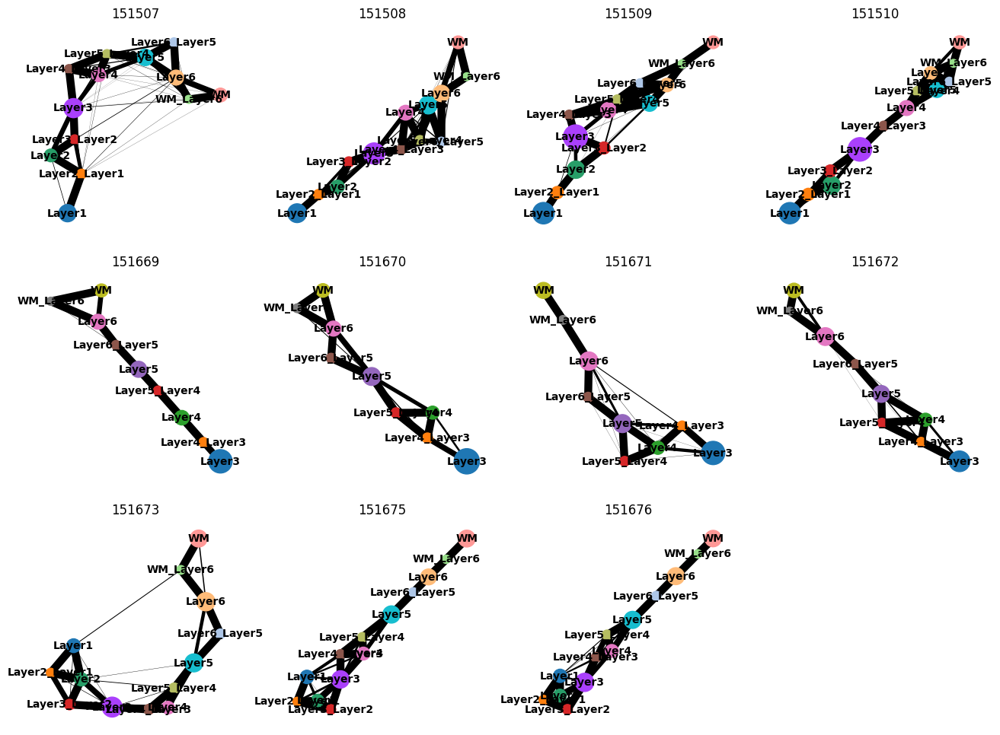

In [21]:
plt.figure(figsize=(16, 12))
base = 1

for input1 in range(len(data_sets)):
    data_name = data_sets[input1]
    out_f = f'../datasets/{ds}/{data_name}/'
    idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')

    features = pd.read_csv(f'{out_f}interface_SpatialPCs.csv', index_col=0).T
    idata.obsm['smooth_pattern_score'] = features.loc[idata.obs_names].to_numpy()
    op.traj.paga_default(idata, label='label')
    idata.obs['label'] = idata.obs['label'].astype('category').cat.rename_categories({
        'WM_WM': 'WM',    
        'Layer4_Layer4': 'Layer4',    
        'Layer1_Layer1': 'Layer1',    
        'Layer5_Layer5': 'Layer5',    
        'Layer6_Layer6': 'Layer6',    
        'Layer2_Layer2': 'Layer2',    
        'Layer3_Layer3': 'Layer3',    
    })
    ax = plt.subplot(3, 4, base)
    sc.pl.paga(idata, frameon=False, title=data_name, show=False,ax = ax)
    base += 1
        
plt.savefig(f'../figures/{ds}_interface_paga.pdf', bbox_inches="tight",dpi=300)


svi supp

In [ ]:
ds = 'DFPLC'
for input1 in range(len(data_sets)):
    sample_name = data_sets[input1]
    out_f = f'../datasets/{ds}/{sample_name}/'
    adata = anndata.read_h5ad(f'{out_f}/adata.h5ad')
    idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')
    
    svi_df, svi_df_strict = op.svi.combine_SVI(idata,threshold=0.01)
    op.svi.eva_SVI(idata, svi_df_strict)
    plt.savefig(f'../figures/{ds}_{sample_name}_metric.png', dpi=300,bbox_inches='tight')
    plt.close()
    
    op.util.adata_moranI(adata, out_f=out_f)
    merged_df,lri_pw_list,gene_lr_list,gene_pw_list = op.vis.svg_svi_relation(adata, idata, title=sample_name, is_human=adata.uns['is_human'], top=50)
    plt.savefig(f'../figures/{ds}_{sample_name}_relation.png', dpi=600,bbox_inches='tight')
    plt.close()
    
    import gseapy
    membership=pd.get_dummies(merged_df.set_index('Term')['group']).groupby('Term').sum().astype(str).agg('-'.join, axis=1)
    merged_df['group name'] = membership.loc[merged_df.Term].to_numpy()
    rename_dict = {
        '1-0-0': 'LR', '1-0-1':'SVI&LR', '0-0-1':'SVI', '1-1-1':'All', '0-1-0':'SVG', '0-1-1':'SVI&SVG', '1-1-0':'LR&SVG','0-1':'SVI','1-1': 'SVI&LR'
    }
    merged_df['group name'] = merged_df['group name'] .astype('category').cat.rename_categories(rename_dict).to_numpy()
    op.vis.enrichment(merged_df,x_key='group name', cutoff=0.05, top_term=20,size=15,save=f'../figures/{ds}_{sample_name}_relation_enrichment.png')
            
    op.vis.pattern_LRI(idata,show_SVI=10, spot_size=5)
    plt.tight_layout()
    plt.savefig(f'../figures/{ds}_{sample_name}_patterns.png', dpi=600,bbox_inches='tight')
    plt.close()
    
    op.svi.eva_pattern(idata)
    plt.savefig(f'../figures/{ds}_{sample_name}_pattern_metric.png', dpi=600,bbox_inches='tight')
    plt.close()
    
    merged_df_edge, arr = op.er.pattern_enrichment_edge(idata,is_human=adata.uns['is_human'])
    merged_df_node, arr = op.er.pattern_enrichment_node(idata,is_human=adata.uns['is_human'])
    op.vis.enrichment(merged_df_node,x_key='label', cutoff=0.05, top_term=20,save=f'../figures/{ds}_{sample_name}_pattern_enrichment_node.png',size=15)
    try:
        op.vis.enrichment(merged_df_edge,x_key='label', cutoff=0.05, top_term=20,save=f'../figures/{ds}_{sample_name}_pattern_enrichment_edge.png')
    except Exception as e:
        print(e)
    
    idata = idata[:, idata.var['is_svi']==1]
    adata, adata_lri, adata_pattern = op.cell_transform(idata, adata, label=adata.uns['cluster_key'])
    
    with plt.rc_context():
        sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', show=False, cmap='plasma')
        plt.savefig(f'../figures/{ds}_{sample_name}_label_SVI.png', bbox_inches="tight")
        plt.close()
        
    with plt.rc_context():
        sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', n_genes=1, show=False, cmap='plasma')
        plt.savefig(f'../figures/{ds}_{sample_name}_label_SVI1.png', bbox_inches="tight")
        plt.close()
        
    with plt.rc_context(): 
        sc.pl.rank_genes_groups_dotplot(adata_pattern, standard_scale='var', n_genes=1, show=False, cmap='plasma')
        plt.savefig(f'../figures/{ds}_{sample_name}_label_pattern.png', bbox_inches="tight")
        plt.close()
    
